In [84]:
!pip3 install matplotlib seaborn scipy python-pptx pandas plotly nbformat==4.2.0

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.


In [85]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from pptx import Presentation
from pptx.util import Inches
import io
from scipy.interpolate import make_interp_spline

In [86]:
df = pd.read_csv("parsed_biophys_researchers.csv")
df.head()
print(df[df['name']=='Aarav Gupta'])
print(df[df['name']=='Julien Tailleur'])

Empty DataFrame
Columns: [Unnamed: 0, name, start, end, institution]
Index: []
     Unnamed: 0             name  start   end institution
482         482  Julien Tailleur   2022  2024         MIT


In [87]:
df['range'] = df['end'] - df['start']
df.head()

,Unnamed: 0,name,start,end,institution,range
0,0,Jutta Luettmer-Strathmann,2010,2024,Akron,14
1,1,Ichiro Miyagawa,1965,1985,Alabama,20
2,2,"Chester Alexander, Jr.",1968,1990,Alabama,22
3,3,John H. Young,1978,1982,UAB,4
4,4,James C. Martin,1980,1995,UAB,15


In [88]:
start_year = df['start'].min()
end_year = max(df['end'].max(), pd.Timestamp.now().year)
years = range(start_year, end_year + 1)
print(start_year, end_year, years)

1913 2024 range(1913, 2025)


In [89]:
# Active in year
with open("outactive.txt", "w") as f:
    for yr in years:
        filtered_df = df[(df['start'] <= yr) & (df['end'] >= yr)]
        f.write(f"Year: {yr}\n")

        # Create a string of institutions and names
        institution_names = []
        for institution in filtered_df['institution'].unique():
            names = filtered_df[filtered_df['institution'] == institution]['name'].tolist()
            institution_names.append(f"{institution}: {', '.join(names)}")
        
        # Join all institution strings into a single string
        result_string = '\n'.join(institution_names)
        f.write(result_string)
        f.write('\n\n')

    print("Writing Completed")

Writing Completed


In [122]:
# started in year
with open("outstart.txt", "w") as f:
    for yr in years:
        filtered_df = df[(df['start'] == yr)]
        f.write(f"Year: {yr}\n")

        # Create a string of institutions and names
        institution_names = []
        for institution in filtered_df['institution'].unique():
            names = filtered_df[filtered_df['institution'] == institution]['name'].tolist()
            institution_names.append(f"{institution}: {', '.join(names)}")
        
        # Join all institution strings into a single string
        result_string = '\n'.join(institution_names)
        f.write(result_string)
        f.write('\n\n')

    print("Writing Completed")

Writing Completed


In [123]:
# ended in year
with open("outend.txt", "w") as f:
    for yr in years:
        filtered_df = df[(df['end'] == yr)]
        f.write(f"Year: {yr}\n")

        # Create a string of institutions and names
        institution_names = []
        for institution in filtered_df['institution'].unique():
            names = filtered_df[filtered_df['institution'] == institution]['name'].tolist()
            institution_names.append(f"{institution}: {', '.join(names)}")
        
        # Join all institution strings into a single string
        result_string = '\n'.join(institution_names)
        f.write(result_string)
        f.write('\n\n')

    print("Writing Completed")

Writing Completed


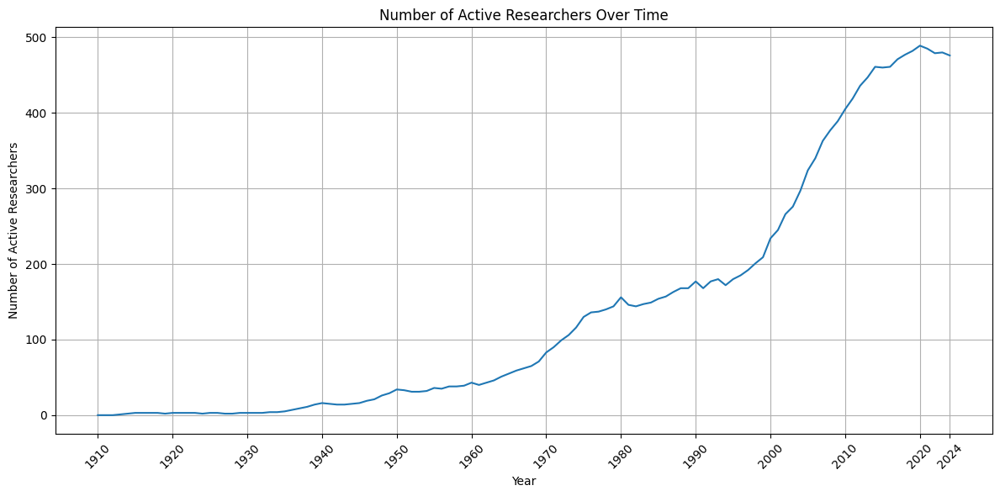

In [90]:
# Find the range of years
# start_year = df['start'].min()
start_year = 1910
end_year = max(df['end'].max(), pd.Timestamp.now().year)
years = list(range(start_year, end_year + 1))

# Count active researchers for each year
active_counts = []
for year in years:
    active_count = ((df['start'] <= year) & (df['end'] >= year)).sum()
    active_counts.append(active_count)

# Create the plot
plt.figure(figsize=(12, 6))
plt.plot(years, active_counts)
plt.title('Number of Active Researchers Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Active Researchers')
plt.grid(True)

# Display every 15th year on the x-axis
x_ticks = list(range(start_year, end_year, 10))
if end_year not in x_ticks:
    x_ticks.append(end_year)

plt.xticks(x_ticks, rotation=45)
plt.tight_layout()
plt.show()

In [91]:
for year, count in zip(range(start_year, end_year), active_counts):
    print(f"{year} | {count}")

1910 | 0
1911 | 0
1912 | 0
1913 | 1
1914 | 2
1915 | 3
1916 | 3
1917 | 3
1918 | 3
1919 | 2
1920 | 3
1921 | 3
1922 | 3
1923 | 3
1924 | 2
1925 | 3
1926 | 3
1927 | 2
1928 | 2
1929 | 3
1930 | 3
1931 | 3
1932 | 3
1933 | 4
1934 | 4
1935 | 5
1936 | 7
1937 | 9
1938 | 11
1939 | 14
1940 | 16
1941 | 15
1942 | 14
1943 | 14
1944 | 15
1945 | 16
1946 | 19
1947 | 21
1948 | 26
1949 | 29
1950 | 34
1951 | 33
1952 | 31
1953 | 31
1954 | 32
1955 | 36
1956 | 35
1957 | 38
1958 | 38
1959 | 39
1960 | 43
1961 | 40
1962 | 43
1963 | 46
1964 | 51
1965 | 55
1966 | 59
1967 | 62
1968 | 65
1969 | 71
1970 | 83
1971 | 90
1972 | 99
1973 | 106
1974 | 116
1975 | 130
1976 | 136
1977 | 137
1978 | 140
1979 | 144
1980 | 156
1981 | 146
1982 | 144
1983 | 147
1984 | 149
1985 | 154
1986 | 157
1987 | 163
1988 | 168
1989 | 168
1990 | 177
1991 | 168
1992 | 177
1993 | 180
1994 | 172
1995 | 180
1996 | 185
1997 | 192
1998 | 201
1999 | 209
2000 | 234
2001 | 245
2002 | 266
2003 | 276
2004 | 297
2005 | 324
2006 | 340
2007 | 363
2008 | 377
20

In [92]:
df.loc[df['end'] != 2024, 'end'] -= 1
df.head()

,Unnamed: 0,name,start,end,institution,range
0,0,Jutta Luettmer-Strathmann,2010,2024,Akron,14
1,1,Ichiro Miyagawa,1965,1984,Alabama,20
2,2,"Chester Alexander, Jr.",1968,1989,Alabama,22
3,3,John H. Young,1978,1981,UAB,4
4,4,James C. Martin,1980,1994,UAB,15


In [93]:
def plot_institution(df, institution):
    # Filter data for the specific institution
    inst_df = df[df['institution'] == institution]
    
    # Find the range of years, rounding to nearest decade
    start_year = math.floor(inst_df['start'].min() / 10) * 10
    # end_year = math.ceil(max(inst_df['end'].max(), pd.Timestamp.now().year) / 10) * 10
    end_year = 2024
    years = range(start_year, end_year + 1)
    
    # Count active researchers for each year
    active_counts = []
    for year in list(years):
        active_count = ((inst_df['start'] <= year) & (inst_df['end'] >= year)).sum()
        active_counts.append(active_count)
        # print("#"*50)
        # print(year)
        # names_string = ', '.join(inst_df[(inst_df['start'] <= year) & (inst_df['end'] >= year)]['name'].tolist())
        # print(names_string)

    # Create the plot
    plt.figure(figsize=(10, 5))
    plt.plot(years, active_counts, marker='o')
    plt.title(f'Number of Active Researchers at {institution} Over Time By Starting Academic Year')
    plt.xlabel('Year')
    plt.ylabel('Number of Active Researchers')
    plt.grid(True)
    
    # Generate x-ticks for every 10th year
    x_ticks = list(range(start_year, end_year + 1, 10))
    plt.xticks(x_ticks, rotation=45)
    
    # Set x-axis limits
    plt.xlim(start_year, end_year)
    
    plt.tight_layout()
    plt.show()


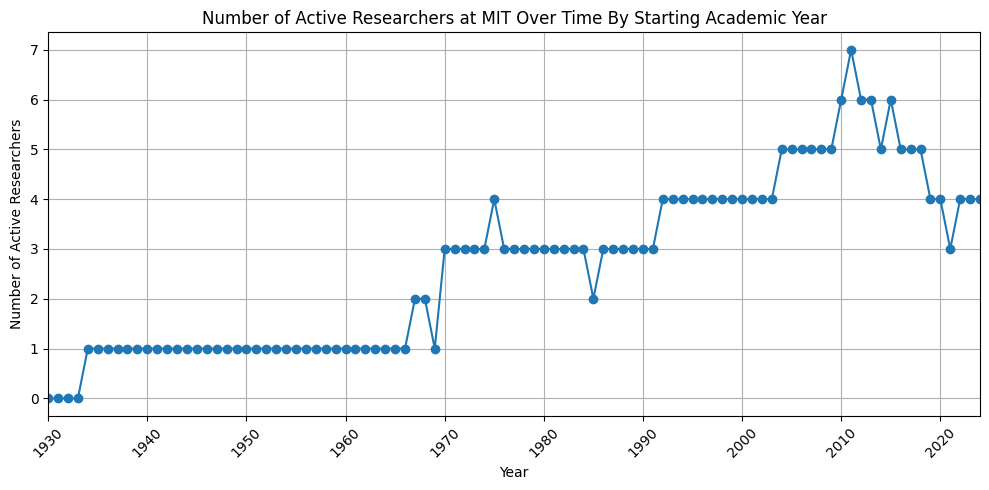

,Unnamed: 0,name,start,end,institution,range
153,153,Laura Finzi,2024,2024,Clemson,0
402,402,Maria Mukhina,2024,2024,Maryland,0
439,439,Suraj Shankar,2024,2024,Michigan,0


In [94]:
plot_institution(df, "MIT")
# change horizontal to starting academic year
# try exponential fits
# look at edge case where start_year == end_year, might be weird where with the -1, end < start so need to handle
df[df['start'] == df['end']]

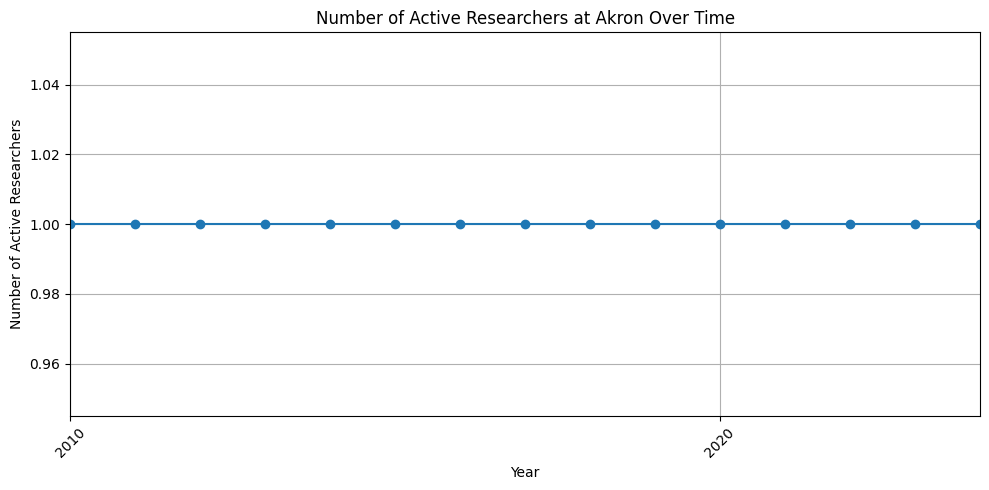

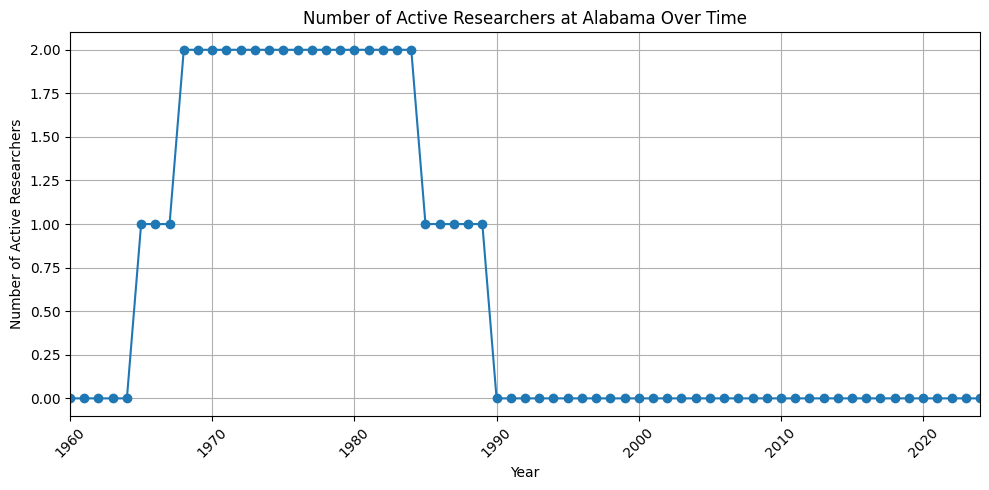

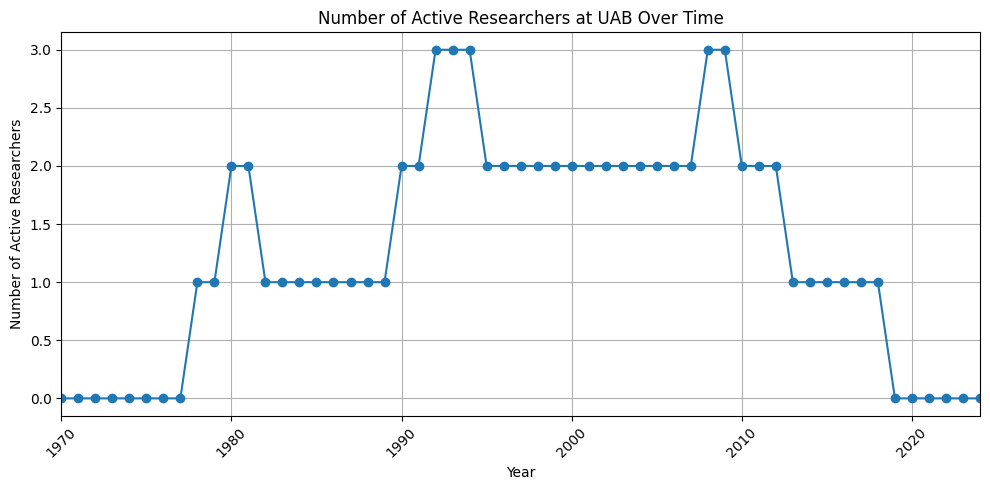

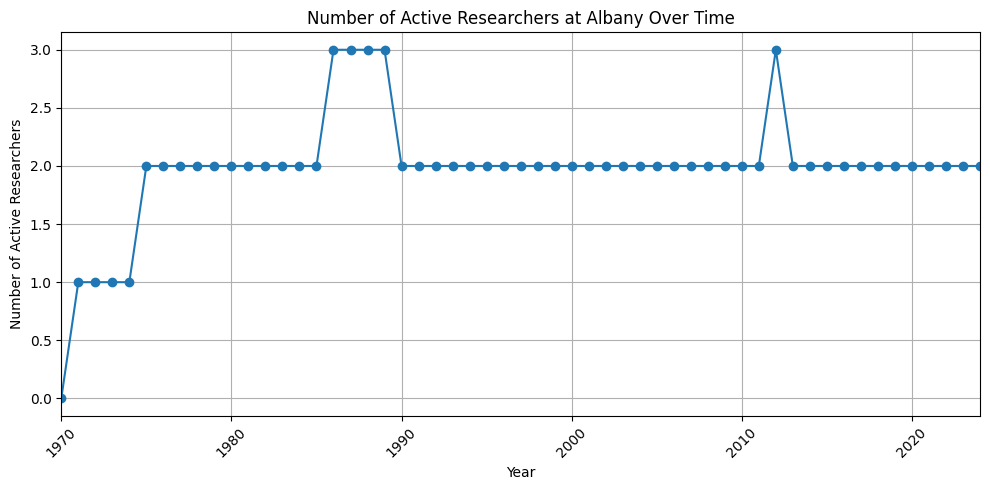

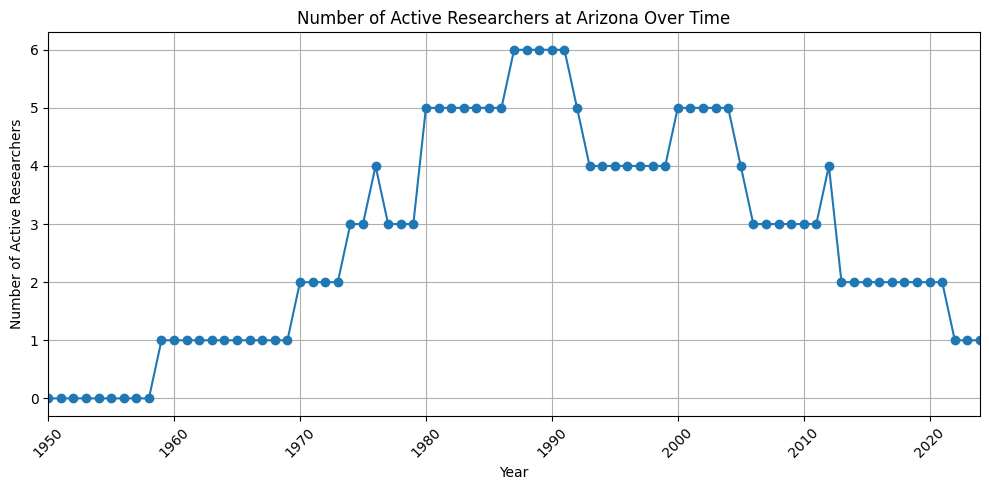

...

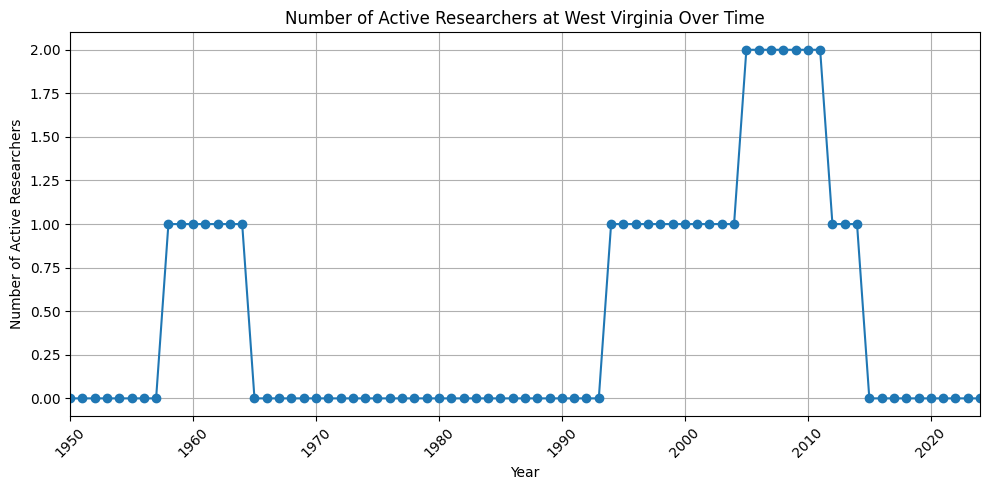

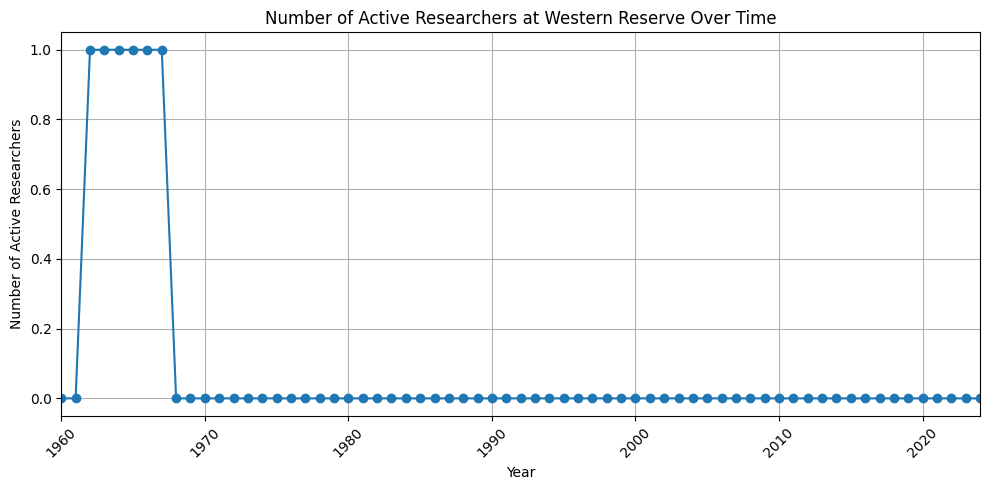

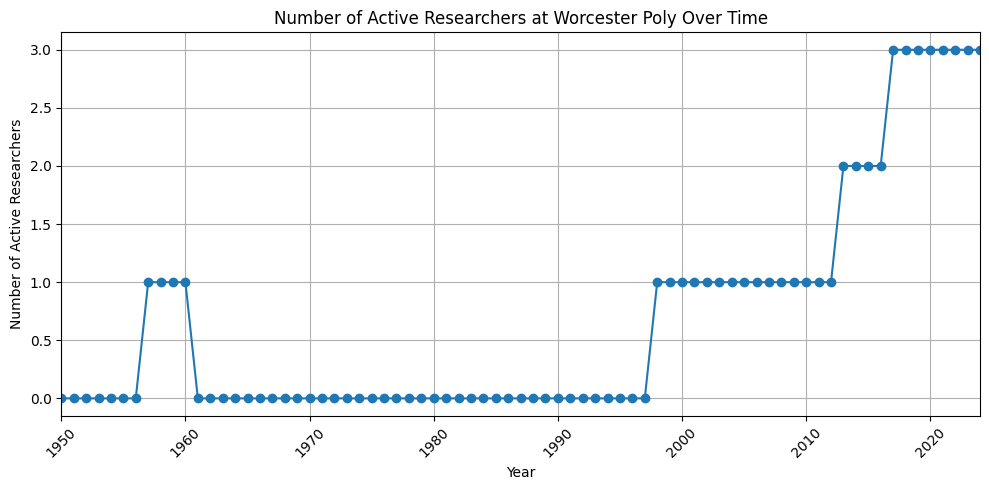

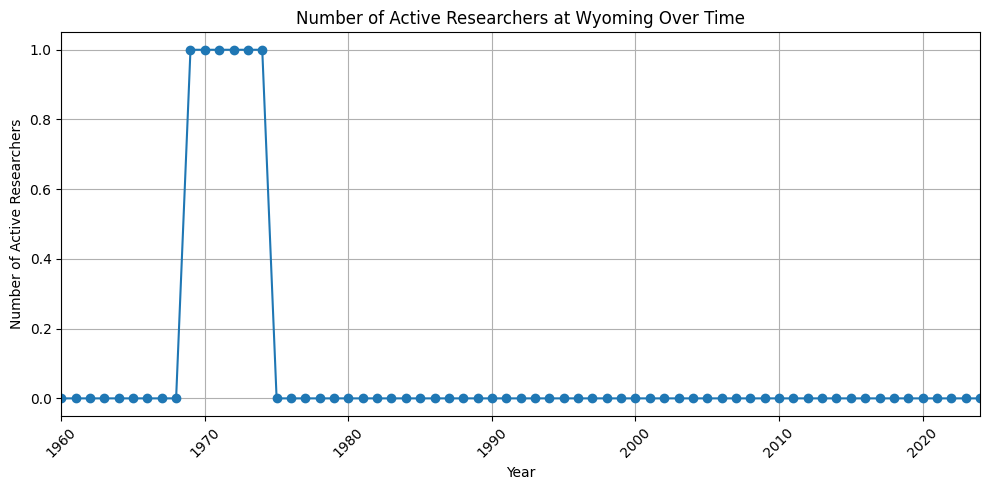

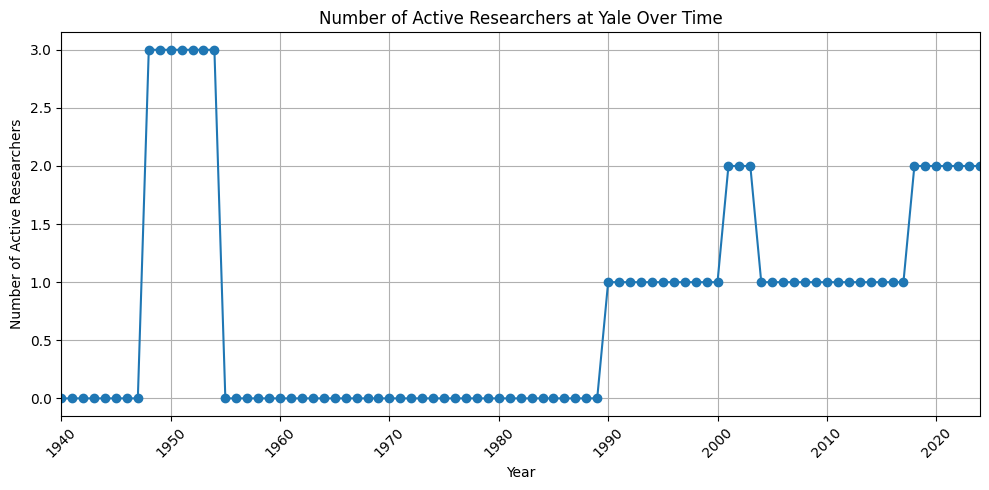

In [95]:
# run to output in cell

def plot_institution(df, institution):
    # Filter data for the specific institution
    inst_df = df[df['institution'] == institution]
    
    # Find the range of years, rounding to nearest decade
    start_year = math.floor(inst_df['start'].min() / 10) * 10
    # end_year = math.ceil(max(inst_df['end'].max(), pd.Timestamp.now().year) / 10) * 10
    end_year = 2024
    years = range(start_year, end_year + 1)
    
    # Count active researchers for each year
    active_counts = []
    for year in list(years):
        active_count = ((inst_df['start'] <= year) & (inst_df['end'] >= year)).sum()
        active_counts.append(active_count)
    
    # Create the plot
    plt.figure(figsize=(10, 5))
    plt.plot(years, active_counts, marker='o')
    plt.title(f'Number of Active Researchers at {institution} Over Time')
    plt.xlabel('Year')
    plt.ylabel('Number of Active Researchers')
    plt.grid(True)
    
    # Generate x-ticks for every 10th year
    x_ticks = list(range(start_year, end_year + 1, 10))
    plt.xticks(x_ticks, rotation=45)
    
    # Set x-axis limits
    plt.xlim(start_year, end_year)
    
    plt.tight_layout()
    plt.show()

# Generate plots for each institution
for institution in df['institution'].unique():
    plot_institution(df, institution)

In [96]:
df.dtypes

Unnamed: 0      int64
name           object
start           int64
end             int64
institution    object
range           int64
dtype: object

In [97]:
# run to save locally ppt
# excluding julien tailleur, MIT -> why??? double check

def plot_institution(df, institution):
    # Filter data for the specific institution
    inst_df = df[df['institution'] == institution]
    
    # Find the range of years, rounding to nearest decade
    start_year = math.floor(inst_df['start'].min() / 10) * 10
    # end_year = math.ceil(max(inst_df['end'].max(), pd.Timestamp.now().year) / 10) * 10
    end_year = 2024
    years = range(start_year, end_year + 1)
    
    # Count active researchers for each year
    active_counts = []
    for year in list(years):
        active_count = ((year >= inst_df['start']) & (year <= inst_df['end'])).sum()
        active_counts.append(active_count)
    
    # Create the plot
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(years, active_counts)
    ax.set_title(f'Number of Active Researchers at {institution} Over Time')
    ax.set_xlabel('Year')
    ax.set_ylabel('Number of Active Researchers')
    ax.grid(True)
    
    # Generate x-ticks for every 10th year
    x_ticks = list(range(start_year, end_year + 1, 10))
    if 2024 not in x_ticks:
        x_ticks.append(2024)

    ax.set_xticks(x_ticks)
    ax.set_xticklabels(x_ticks, rotation=45)
    
    # Set x-axis limits
    ax.set_xlim(start_year, end_year)

    # Set y-axis to use integer ticks
    ax.yaxis.set_major_locator(plt.MaxNLocator(integer=True))
    
    # Ensure y-axis starts at 0
    ax.set_ylim(bottom=0)
    
    plt.tight_layout()
    
    # Save the plot to a bytes buffer
    buf = io.BytesIO()
    plt.savefig(buf, format='png')
    buf.seek(0)
    plt.close(fig)
    
    return buf

# Create a new PowerPoint presentation
prs = Presentation()

# Generate plots for each institution and add to PowerPoint
for institution in df['institution'].unique():
    # Add a new slide
    slide = prs.slides.add_slide(prs.slide_layouts[5])  # Use layout 5 (Title and Content)
    
    # Set the slide title
    title = slide.shapes.title
    title.text = f'Researchers at {institution}'
    
    # Generate the plot
    img_buf = plot_institution(df, institution)
    
    # Add the plot to the slide
    left = Inches(1)
    top = Inches(1.5)
    width = Inches(8)
    height = Inches(4.5)
    slide.shapes.add_picture(img_buf, left, top, width, height)

# Save the PowerPoint presentation
ppt_path = 'institution_plots.pptx'
prs.save(ppt_path)

print(f"PowerPoint presentation saved as {ppt_path}")

PowerPoint presentation saved as institution_plots.pptx


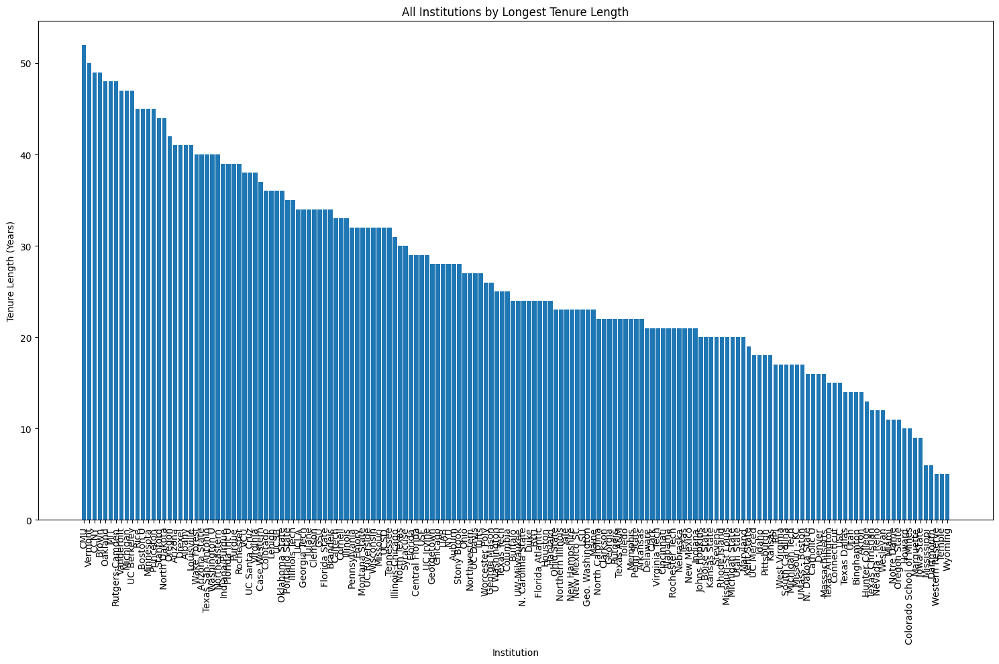

Longest-tenured faculty members:
CMU: John Nagle (52 years)
Vermont: Wesley Nyborg (50 years)
CCNY: Robert R. Alfano (49 years)
Brown: Leon Cooper (49 years)
Oakland: Abraham R. Liboff (48 years)
MIT: George Benedek (48 years)
Rutgers-Camden: L. John Gagliardi (48 years)
Vanderbilt: John P. Wikswo (47 years)
Michigan: Daniel Axelrod (47 years)
UC Berkeley: Donald Glaser (47 years)
Rice: Huey W. Huang (45 years)
Boston U: H. Eugene Stanley (45 years)
Minnesota: Russell K. Hobbie (45 years)
Princeton: Robert Austin (45 years)
Stanford: Seb Doniach (44 years)
North Dakota: Glenn Lykken (44 years)
Oregon: Brian W. Matthews (42 years)
Arizona: Douglas J. Donahue (41 years)
Drexel: Frank Ferrone (41 years)
Albany: Tara Prasad Das (41 years)
Louisville: Manuel Schwartz (41 years)
Wake Forest: Howard W. Shields (40 years)
Arizona State: Stuart M. Lindsay (40 years)
Texas San Antonio: Dhiraj Sardar (40 years)
Washington U: James G. Miller (40 years)
Northeastern: Paul Champion (40 years)
Indian

In [98]:
# FIX THE LABELING, THIS IS BY PERSON

df['tenure'] = df['end'] - df['start']
df_combined = df.groupby(['institution', 'name'])['tenure'].sum().reset_index()

# Find the longest-tenured faculty member for each institution
longest_tenures = df_combined.loc[df_combined.groupby('institution')['tenure'].idxmax()]
top = None
# Sort by tenure length in descending order
if top:
    longest_tenures = longest_tenures.sort_values('tenure', ascending=False).head(top)
else:
    longest_tenures = longest_tenures.sort_values('tenure', ascending=False)

# Create the bar plot
plt.figure(figsize=(15, 10))
bars = plt.bar(longest_tenures['institution'], longest_tenures['tenure'])
if top:
    plt.title(f'Top {top} Institutions by Longest Tenure Length')
else:
    plt.title('All Institutions by Longest Tenure Length')
plt.xlabel('Institution')
plt.ylabel('Tenure Length (Years)')
plt.xticks(rotation=90)

# Add value labels on top of each bar
for bar in bars:
    height = bar.get_height()
    # plt.text(bar.get_x() + bar.get_width()/2., height,
    #          f'{height:.0f}',
    #          ha='center', va='bottom')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

# Print the names of the longest-tenured faculty members
print("Longest-tenured faculty members:")
for _, row in longest_tenures.iterrows():
    print(f"{row['institution']}: {row['name']} ({row['tenure']} years)")

In [99]:
def condense_tenures(df):
    # Sort the dataframe by name and start date
    df_sorted = df.sort_values(['name', 'start'])
    
    # Group by name
    grouped = df_sorted.groupby('name')
    
    condensed_data = []
    
    for name, group in grouped:
        start = group['start'].min()
        end = group['end'].max()
        institutions = group['institution'].tolist()
        
        # Check for continuous tenure and calculate active tenure
        continuous = True
        active_tenure = 0
        for i in range(len(group)):
            if i > 0 and group.iloc[i]['start'] > group.iloc[i-1]['end']:
                continuous = False
            active_tenure += group.iloc[i]['end'] - group.iloc[i]['start']
        
        condensed_data.append({
            'name': name,
            'start': start,
            'end': end,
            'institutions': institutions,
            'continuous': continuous,
            'active_tenure': active_tenure
        })
    
    # Create new dataframe
    df_condensed = pd.DataFrame(condensed_data)
    
    # Calculate total span (end - start)
    df_condensed['total_span'] = df_condensed['end'] - df_condensed['start']
    
    return df_condensed

# Assuming your original dataframe is named 'df'
df_condensed = condense_tenures(df)

# Display the first few rows of the new dataframe
print(df_condensed.head())

# You can also save this to a CSV if needed
# df_condensed.to_csv('condensed_tenures.csv', index=False)

                   name  start   end    institutions  continuous  \
0  A.T. Charlie Johnson   2007  2024  [Pennsylvania]        True   
1         Abbas Ourmazd   2005  2024  [UW-Milwaukee]        True   
2        Abhijit Sarkar   2008  2024    [Catholic U]        True   
3     Abraham R. Liboff   1971  2019       [Oakland]        True   
4   Ahmad Hosseinizadeh   2011  2024  [UW-Milwaukee]        True   

   active_tenure  total_span  
0             17          17  
1             19          19  
2             16          16  
3             48          48  
4             13          13  


In [100]:
df['completed'] = df['end'].apply(lambda x: x != 2024) 
df.head()

,Unnamed: 0,name,start,end,institution,range,tenure,completed
0,0,Jutta Luettmer-Strathmann,2010,2024,Akron,14,14,False
1,1,Ichiro Miyagawa,1965,1984,Alabama,20,19,True
2,2,"Chester Alexander, Jr.",1968,1989,Alabama,22,21,True
3,3,John H. Young,1978,1981,UAB,4,3,True
4,4,James C. Martin,1980,1994,UAB,15,14,True


In [101]:
df_condensed['completed'] = df_condensed['end'].apply(lambda x: x != 2024) 
df_condensed[df_condensed['institutions'].apply(lambda x:len(x))>1].head()

,name,start,end,institutions,continuous,active_tenure,total_span,completed
46,Andrew Mugler,2014,2024,"[Purdue, Pittsburgh]",False,9,10,False
89,Boris Shraiman,2002,2024,"[Rutgers, UCSB]",False,21,22,False
90,Bradley John Roth,1995,2019,"[Vanderbilt, Oakland]",False,23,24,True
204,Edmund P. Day,1976,2000,"[Buffalo, Emory]",False,13,24,True
244,Fred M. Uber,1936,1947,"[Missouri, Iowa State]",False,8,11,True


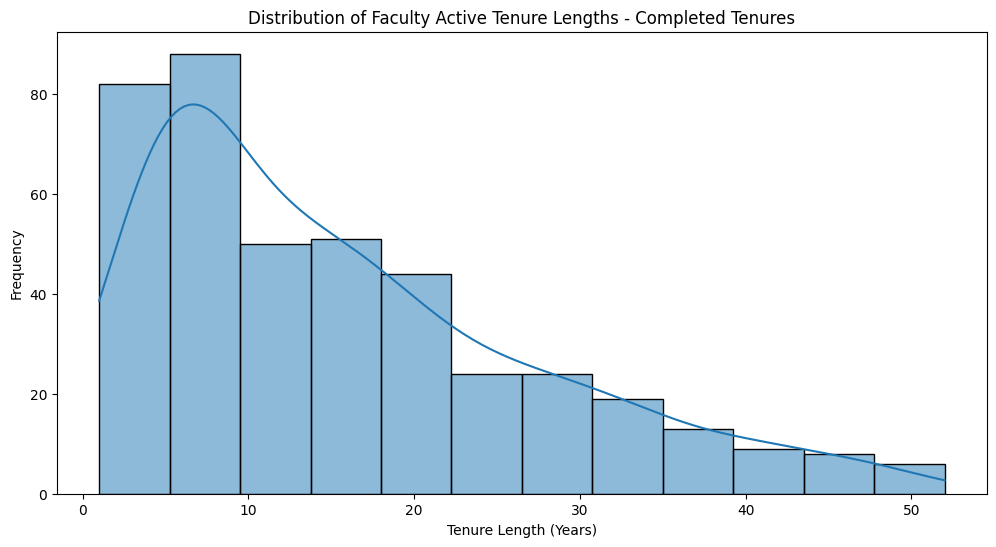

In [102]:
plt.figure(figsize=(12, 6))
sdf = df_condensed[df_condensed['completed']==True]
sns.histplot(sdf['active_tenure'], kde=True)
plt.title('Distribution of Faculty Active Tenure Lengths - Completed Tenures')
plt.xlabel('Tenure Length (Years)')
plt.ylabel('Frequency')
plt.show()

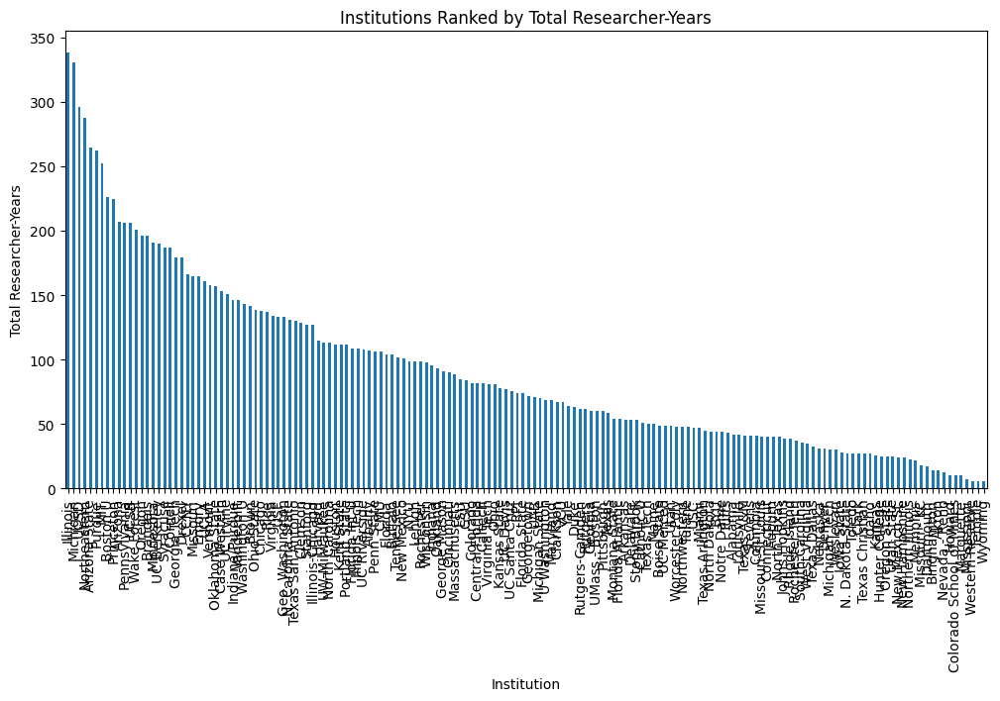

In [103]:
institution_years = df.groupby('institution')['range'].sum().sort_values(ascending=False)
plt.figure(figsize=(12, 6))
institution_years.plot(kind='bar')
plt.title('Institutions Ranked by Total Researcher-Years')
plt.xlabel('Institution')
plt.ylabel('Total Researcher-Years')
plt.xticks(rotation=90)
plt.show()

In [104]:
from collections import Counter
from scipy.signal import savgol_filter


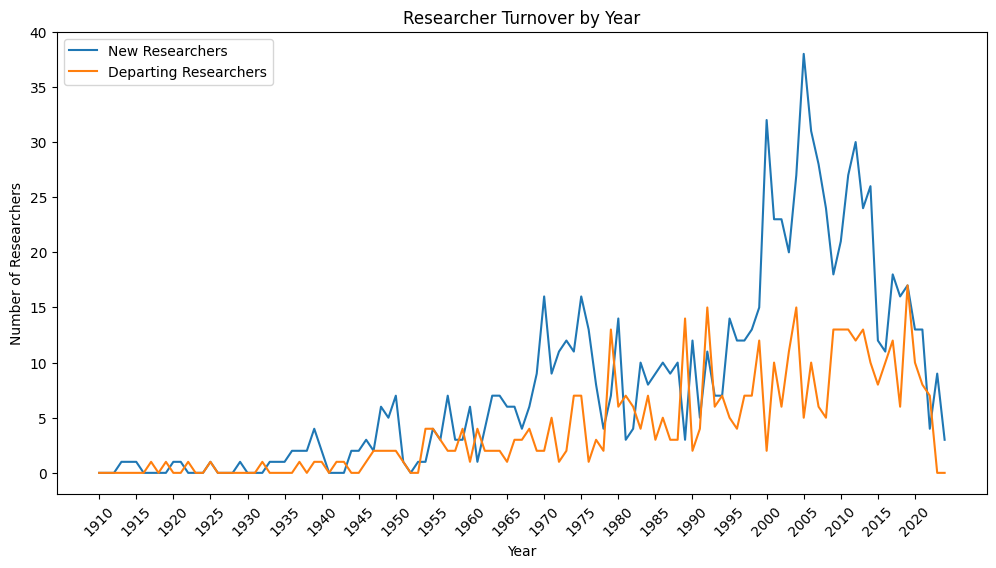

In [105]:
# FIX THIS, GRAPH WRONG
# SOMETHING WRONG WITH PLOTTING STARTS AND ENDS

starts = df['start'].value_counts().sort_index()
ends = df['end'].value_counts().sort_index()

# Remove the 2024 data point for departing researchers
ends = ends[ends.index != 2024]
year_range = range((starts.index.min()//5)*5, 2025, 5)
y_range = range(0,((max(max(starts.values),max(ends.values))//5)+1)*5+1,5)

full_range = pd.Series(index=range(1910, 2025), data=0)
starts_filled = full_range.add(starts, fill_value=0)
ends_filled = full_range.add(ends, fill_value=0)

plt.figure(figsize=(12, 6))
plt.plot(starts_filled.index, starts_filled.values, label='New Researchers')
plt.plot(ends_filled.index, ends_filled.values, label='Departing Researchers')
plt.title('Researcher Turnover by Year')
plt.xlabel('Year')
plt.ylabel('Number of Researchers')

plt.xticks(year_range, rotation=45)
plt.yticks(y_range)

plt.legend()
plt.show()

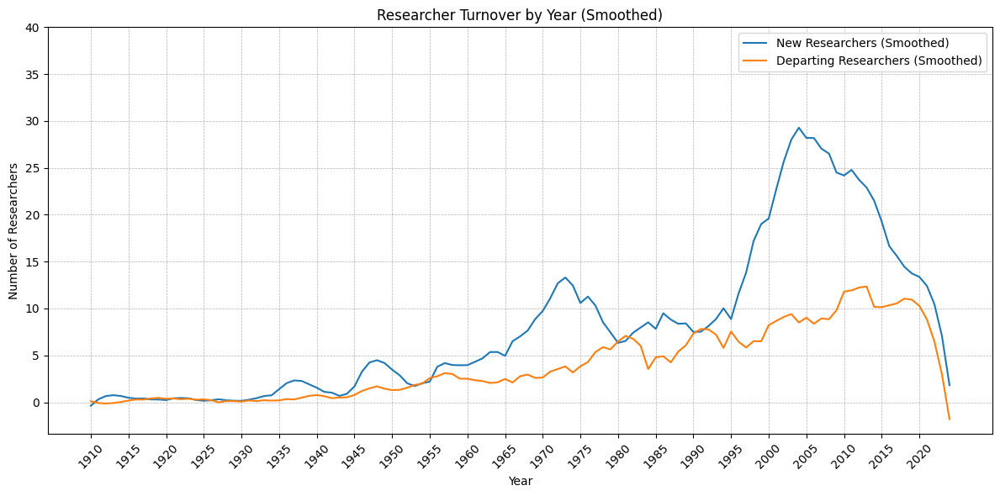

In [106]:
# Your existing code for data preparation
starts = df['start'].value_counts().sort_index()
ends = df['end'].value_counts().sort_index()

# Remove the 2024 data point for departing researchers
ends = ends[ends.index != 2024]
year_range = range((starts.index.min()//5)*5, 2025, 5)
y_range = range(0,((max(max(starts.values),max(ends.values))//5)+1)*5+1,5)

full_range = pd.Series(index=range(1910, 2025), data=0)
starts_filled = full_range.add(starts, fill_value=0)
ends_filled = full_range.add(ends, fill_value=0)

# Apply smoothing
window_length = 11  # Must be odd and less than the length of the data
poly_order = 3  # Polynomial order for the filter

starts_smooth = savgol_filter(starts_filled.values, window_length, poly_order)
ends_smooth = savgol_filter(ends_filled.values, window_length, poly_order)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(starts_filled.index, starts_smooth, label='New Researchers (Smoothed)')
plt.plot(ends_filled.index, ends_smooth, label='Departing Researchers (Smoothed)')

# Add original data as scatter points for reference
# plt.scatter(starts_filled.index, starts_filled.values, alpha=0.3, color='blue', s=10)
# plt.scatter(ends_filled.index, ends_filled.values, alpha=0.3, color='orange', s=10)

plt.title('Researcher Turnover by Year (Smoothed)')
plt.xlabel('Year')
plt.ylabel('Number of Researchers')

plt.xticks(year_range, rotation=45)
plt.yticks(y_range)

plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

In [107]:
df.sort_values(by='start', ascending=True)

,Unnamed: 0,name,start,end,institution,range,tenure,completed
167,167,Charles C. Trowbridge,1913,1917,Columbia,5,4,True
168,168,James P.C. Southall,1914,1939,Columbia,26,25,True
174,174,John S. Shearer,1915,1919,Cornell,5,4,True
278,278,William Bovie,1920,1925,Harvard,6,5,True
173,173,Floyd K. Richtmyer,1921,1922,Cornell,2,1,True
...,...,...,...,...,...,...,...,...
825,825,Tzer Han Tan,2023,2024,UCSD,1,1,False
465,465,Keith Cassidy,2023,2024,Missouri,1,1,False
402,402,Maria Mukhina,2024,2024,Maryland,0,0,False
439,439,Suraj Shankar,2024,2024,Michigan,0,0,False


In [108]:
df.sort_values(by='end', ascending=True)

,Unnamed: 0,name,start,end,institution,range,tenure,completed
167,167,Charles C. Trowbridge,1913,1917,Columbia,5,4,True
174,174,John S. Shearer,1915,1919,Cornell,5,4,True
173,173,Floyd K. Richtmyer,1921,1922,Cornell,2,1,True
278,278,William Bovie,1920,1925,Harvard,6,5,True
351,351,Jay W. Woodrow,1925,1932,Iowa State,8,7,True
...,...,...,...,...,...,...,...,...
434,434,Jens-Christian Meiners,2001,2024,Michigan,23,23,False
435,435,Michael Zochowski,2001,2024,Michigan,23,23,False
436,436,Jennifer Ogilvie,2005,2024,Michigan,19,19,False
417,417,Chaoming Song,2013,2024,Miami,11,11,False


Replot the Top 40 Tenures by people f"Last Name"
Plenty of people who changed institution but stayed in department -> make graph with total accumulated tenure accounting for people changing institutions

Fix distribution of faculty tenure lengths w.r.t. (

[x] switched institution tenures

[x] omit people researching to present, not completed tenure

)

Institutional Tenure - overlays described in email

Put on overlay/the powerpoint graphs on a single scale

Fixed - Turnover graph -> do by 5-10 years on x axis

Look into grabbing titles + authors from PRL dataset

Process + play with PhD data
* want total/cumulative data
* institution based data
* some overlays with that too




# New request

1. One or more people

2. Two or more people

3. Three or more people

4. Four or more people

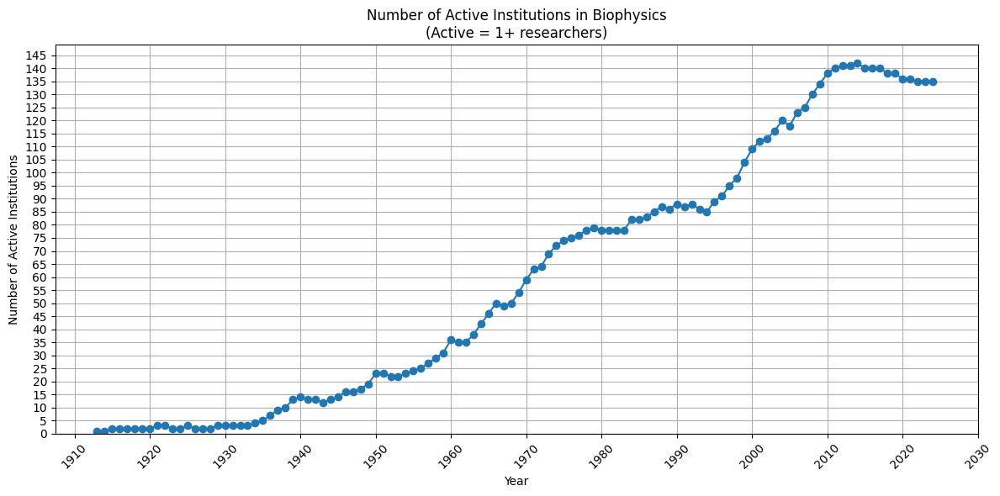

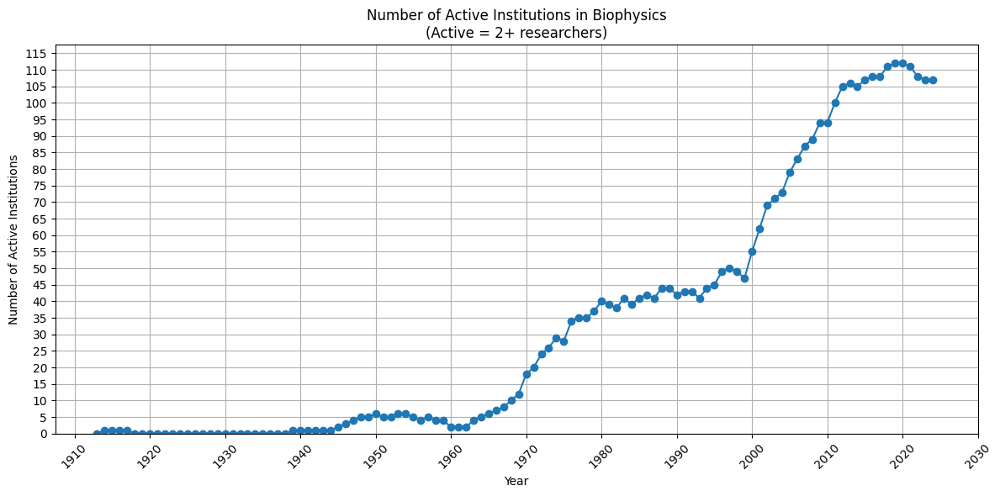

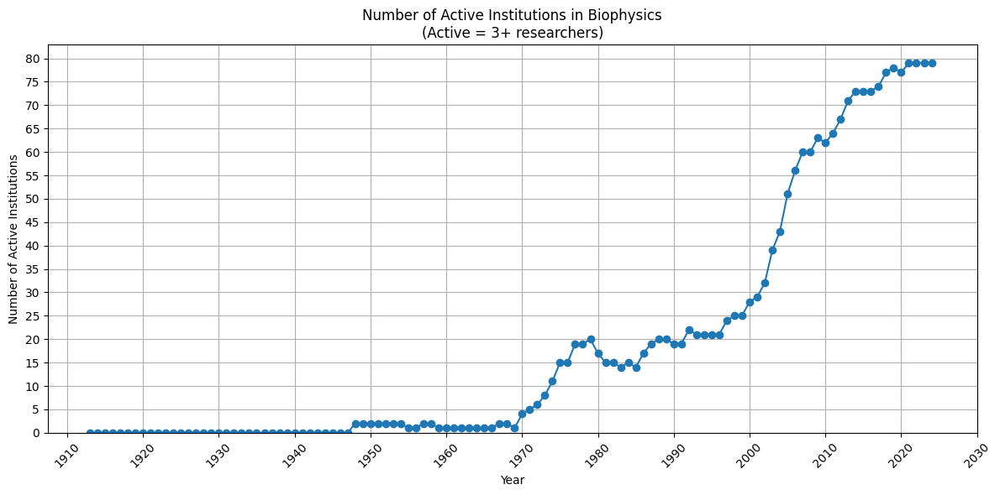

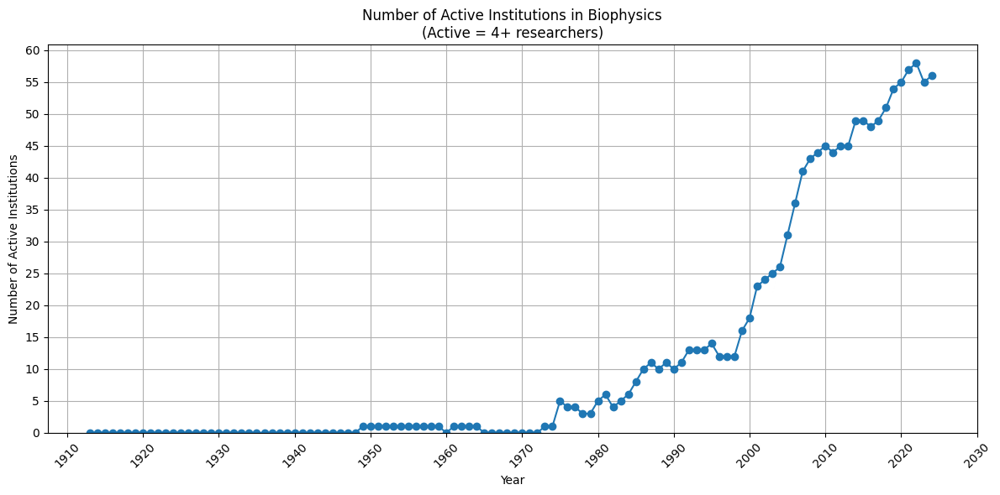

In [109]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def plot_active_institutions(df, min_researchers):
    # Find the range of years
    start_year = df['start'].min()
    end_year = max(df['end'].max(), pd.Timestamp.now().year)
    years = range(start_year, end_year + 1)
    
    # Count active institutions for each year
    active_counts = []
    for year in years:
        active_institutions = df[(df['start'] <= year) & (df['end'] >= year)].groupby('institution').size()
        active_count = (active_institutions >= min_researchers).sum()
        active_counts.append(active_count)
    
    # Create the plot
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(years, active_counts, marker='o')
    ax.set_title(f'Number of Active Institutions in Biophysics\n(Active = {min_researchers}+ researchers)')
    ax.set_xlabel('Year')
    ax.set_ylabel('Number of Active Institutions')
    ax.grid(True)
    
    # Set x-ticks to every 10 years
    x_ticks = np.arange(start_year - (start_year % 10), end_year + 11, 10)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(x_ticks, rotation=45)
    
    # Set y-ticks to increment by 5
    max_count = max(active_counts)
    y_ticks = np.arange(0, max_count + 6, 5)
    ax.set_yticks(y_ticks)
    
    # Ensure y-axis starts at 0
    ax.set_ylim(bottom=0)
    
    plt.tight_layout()
    plt.show()

# Generate the four plots
for min_researchers in [1, 2, 3, 4]:
    plot_active_institutions(df, min_researchers)

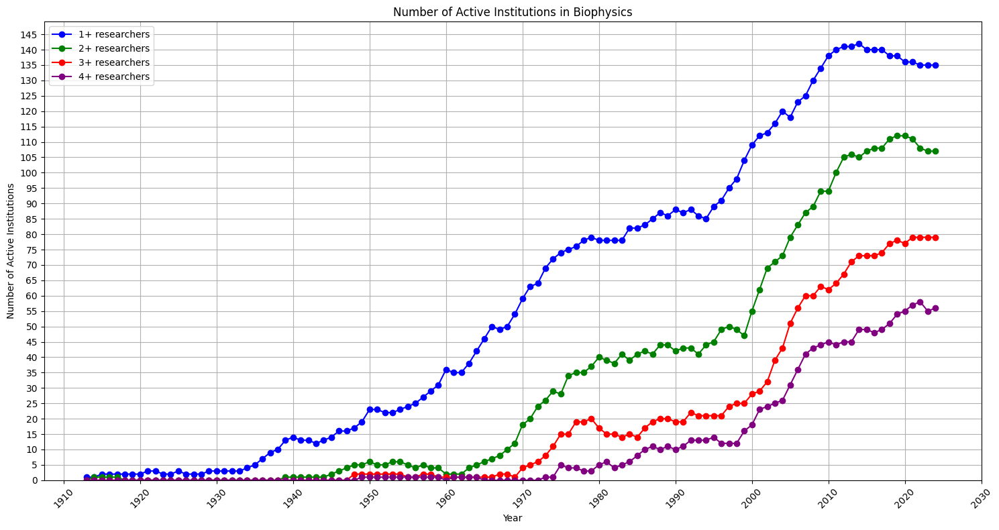

In [110]:
def plot_active_institutions_overlay(df):
    # Find the range of years
    start_year = df['start'].min()
    end_year = max(df['end'].max(), pd.Timestamp.now().year)
    years = range(start_year, end_year + 1)
    
    # Create the plot
    fig, ax = plt.subplots(figsize=(15, 8))
    
    colors = ['blue', 'green', 'red', 'purple']
    labels = ['1+ researchers', '2+ researchers', '3+ researchers', '4+ researchers']
    
    all_active_counts = []  # Store all active counts for finding the maximum later
    
    for i, min_researchers in enumerate([1, 2, 3, 4]):
        active_counts = []
        for year in years:
            active_institutions = df[(df['start'] <= year) & (df['end'] >= year)].groupby('institution').size()
            active_count = (active_institutions >= min_researchers).sum()
            active_counts.append(active_count)
        
        ax.plot(years, active_counts, marker='o', color=colors[i], label=labels[i])
        all_active_counts.extend(active_counts)  # Add this line's counts to the overall list
    
    ax.set_title('Number of Active Institutions in Biophysics')
    ax.set_xlabel('Year')
    ax.set_ylabel('Number of Active Institutions')
    ax.grid(True)
    
    # Set x-ticks to every 10 years
    x_ticks = np.arange(start_year - (start_year % 10), end_year + 11, 10)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(x_ticks, rotation=45)
    
    # Set y-ticks to increment by 5
    max_count = max(all_active_counts)  # Use the maximum from all lines
    y_ticks = np.arange(0, max_count + 6, 5)
    ax.set_yticks(y_ticks)
    
    # Ensure y-axis starts at 0
    ax.set_ylim(bottom=0)
    
    # Add legend
    ax.legend()
    
    plt.tight_layout()
    plt.show()

# Generate the overlay plot
plot_active_institutions_overlay(df)

In [111]:
df.head()

,Unnamed: 0,name,start,end,institution,range,tenure,completed
0,0,Jutta Luettmer-Strathmann,2010,2024,Akron,14,14,False
1,1,Ichiro Miyagawa,1965,1984,Alabama,20,19,True
2,2,"Chester Alexander, Jr.",1968,1989,Alabama,22,21,True
3,3,John H. Young,1978,1981,UAB,4,3,True
4,4,James C. Martin,1980,1994,UAB,15,14,True


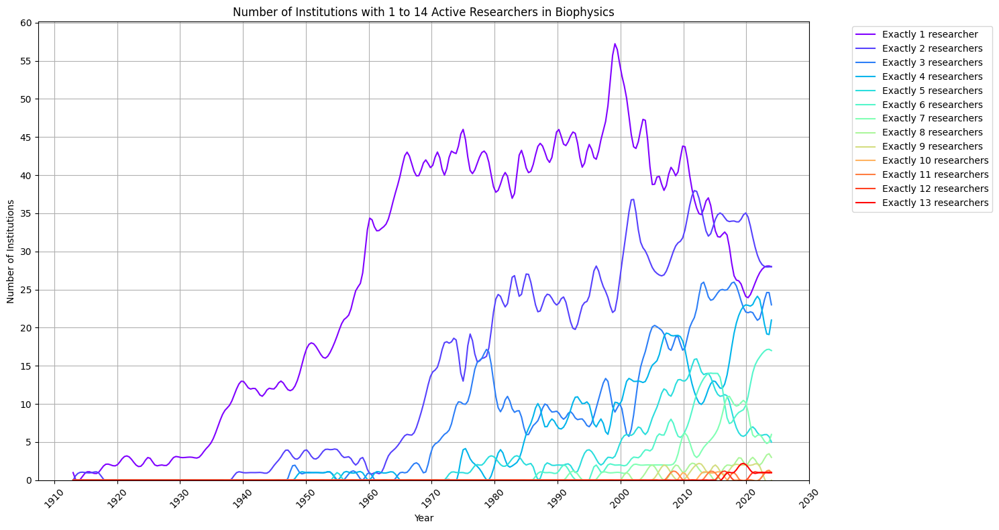

In [112]:
def plot_n_active_institutions_overlay(df):
    # Find the range of years
    start_year = df['start'].min()
    end_year = max(df['end'].max(), pd.Timestamp.now().year)
    years = range(start_year, end_year + 1)
    
    # Determine the maximum number of researchers at any institution in any year
    max_researchers = 0
    for year in years:
        active_institutions = df[(df['start'] <= year) & (df['end'] >= year)].groupby('institution').size()
        max_researchers = max(max_researchers, active_institutions.max())
    
    # Create the plot
    fig, ax = plt.subplots(figsize=(15, 8))
    
    colors = plt.cm.rainbow(np.linspace(0, 1, max_researchers))
    labels = [f'Exactly {i} researcher{"s" if i > 1 else ""}' for i in range(1, max_researchers + 1)]
    
    all_active_counts = []  # Store all active counts for finding the maximum later
    
    for i in range(1, max_researchers + 1):
        active_counts = []
        for year in years:
            active_institutions = df[(df['start'] <= year) & (df['end'] >= year)].groupby('institution').size()
            active_count = (active_institutions == i).sum()
            active_counts.append(active_count)
        
        # Create smooth curve
        years_array = np.array(years)
        active_counts_array = np.array(active_counts)
        
        # Create a smooth spline interpolation
        spl = make_interp_spline(years_array, active_counts_array, k=3)
        years_smooth = np.linspace(years_array.min(), years_array.max(), 300)
        active_counts_smooth = spl(years_smooth)
        
        ax.plot(years_smooth, active_counts_smooth, color=colors[i-1], label=labels[i-1])
        all_active_counts.extend(active_counts)  # Add this line's counts to the overall list
    
    ax.set_title(f'Number of Institutions with 1 to {max_researchers + 1} Active Researchers in Biophysics')
    ax.set_xlabel('Year')
    ax.set_ylabel('Number of Institutions')
    ax.grid(True)
    
    # Set x-ticks to every 10 years
    x_ticks = np.arange(start_year - (start_year % 10), end_year + 11, 10)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(x_ticks, rotation=45)
    
    # Set y-ticks to increment by 5
    max_count = max(all_active_counts)  # Use the maximum from all lines
    y_ticks = np.arange(0, max_count + 6, 5)
    ax.set_yticks(y_ticks)
    
    # Ensure y-axis starts at 0
    ax.set_ylim(bottom=0)
    
    # Add legend
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

# Generate the overlay plot
plot_n_active_institutions_overlay(df)

In [113]:
!pip3 install matplotlib --upgrade

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.


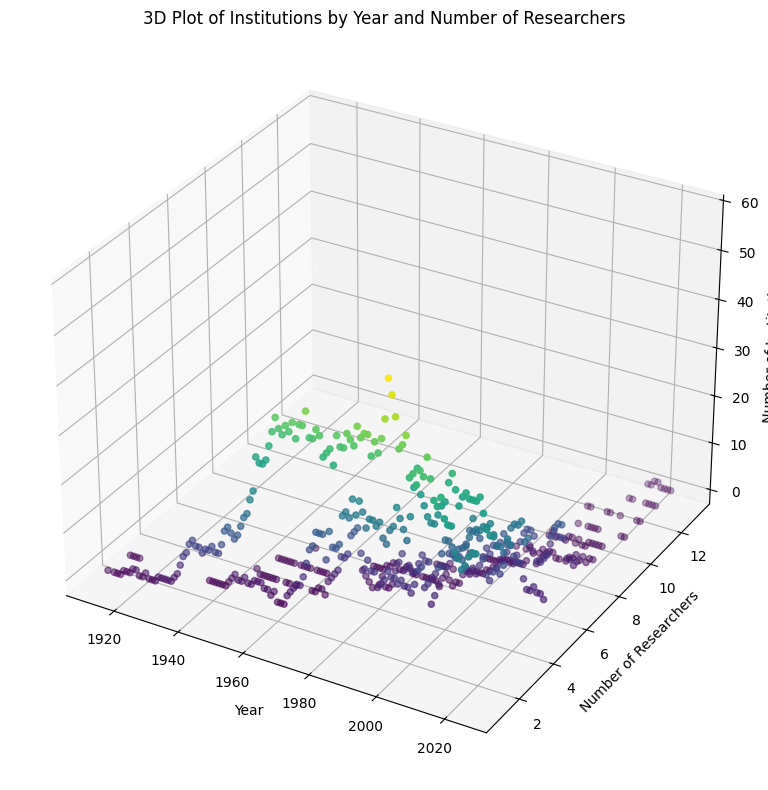

In [114]:
# ... existing code ...
from mpl_toolkits.mplot3d import Axes3D

def plot_n_active_institutions_3d(df):
    # Find the range of years
    start_year = df['start'].min()
    end_year = max(df['end'].max(), pd.Timestamp.now().year)
    years = range(start_year, end_year + 1)
    
    # Prepare data for 3D plotting
    x = []  # Years
    y = []  # Number of researchers
    z = []  # Number of institutions

    for year in years:
        active_institutions = df[(df['start'] <= year) & (df['end'] >= year)].groupby('institution').size()
        for i in range(1, active_institutions.max() + 1):
            count = (active_institutions == i).sum()
            if count > 0:
                x.append(year)
                y.append(i)
                z.append(count)

    # Create the 3D plot
    fig = plt.figure(figsize=(15, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    ax.scatter(x, y, z, c=z, cmap='viridis', marker='o')
    
    ax.set_title('3D Plot of Institutions by Year and Number of Researchers')
    ax.set_xlabel('Year')
    ax.set_ylabel('Number of Researchers')
    ax.set_zlabel('Number of Institutions')
    
    plt.tight_layout()
    plt.show()

# Generate the 3D overlay plot
plot_n_active_institutions_3d(df)

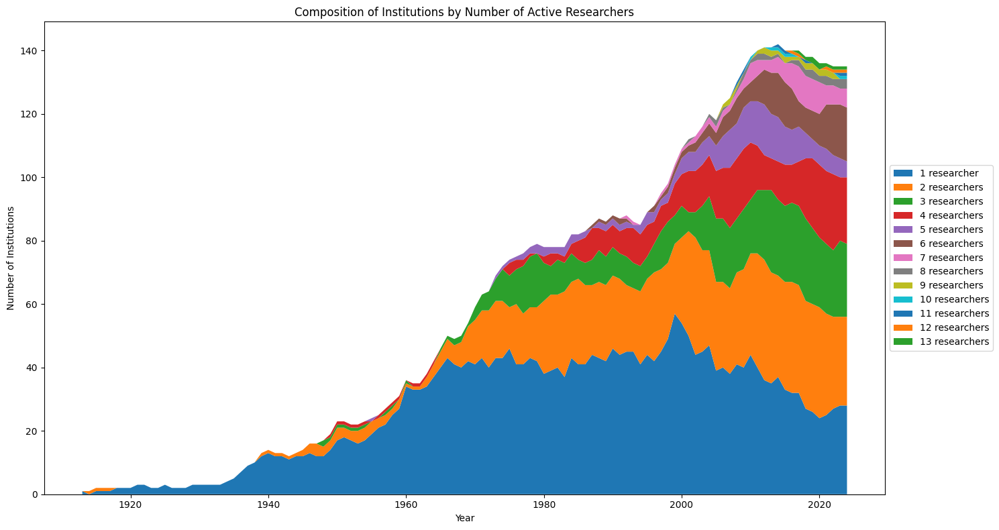

In [115]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def plot_stacked_area(df):
    start_year = df['start'].min()
    end_year = max(df['end'].max(), pd.Timestamp.now().year)
    years = range(start_year, end_year + 1)
    
    max_researchers = 0
    for year in years:
        active_institutions = df[(df['start'] <= year) & (df['end'] >= year)].groupby('institution').size()
        max_researchers = max(max_researchers, active_institutions.max())
    
    data = []
    for i in range(1, max_researchers + 1):
        counts = []
        for year in years:
            active_institutions = df[(df['start'] <= year) & (df['end'] >= year)].groupby('institution').size()
            count = (active_institutions == i).sum()
            counts.append(count)
        data.append(counts)
    
    fig, ax = plt.subplots(figsize=(15, 8))
    ax.stackplot(years, data, labels=[f'{i} researcher{"s" if i > 1 else ""}' for i in range(1, max_researchers + 1)])
    
    ax.set_title('Composition of Institutions by Number of Active Researchers')
    ax.set_xlabel('Year')
    ax.set_ylabel('Number of Institutions')
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.show()

plot_stacked_area(df)

In [116]:
df_condensed.to_csv("byname.csv")
df_condensed.head()

,name,start,end,institutions,continuous,active_tenure,total_span,completed
0,A.T. Charlie Johnson,2007,2024,[Pennsylvania],True,17,17,False
1,Abbas Ourmazd,2005,2024,[UW-Milwaukee],True,19,19,False
2,Abhijit Sarkar,2008,2024,[Catholic U],True,16,16,False
3,Abraham R. Liboff,1971,2019,[Oakland],True,48,48,True
4,Ahmad Hosseinizadeh,2011,2024,[UW-Milwaukee],True,13,13,False


In [117]:
"Julien Tailleur" in list(df['name'])

True

In [118]:
df.loc[df['name']=='Julien Tailleur']

,Unnamed: 0,name,start,end,institution,range,tenure,completed
482,482,Julien Tailleur,2022,2024,MIT,2,2,False


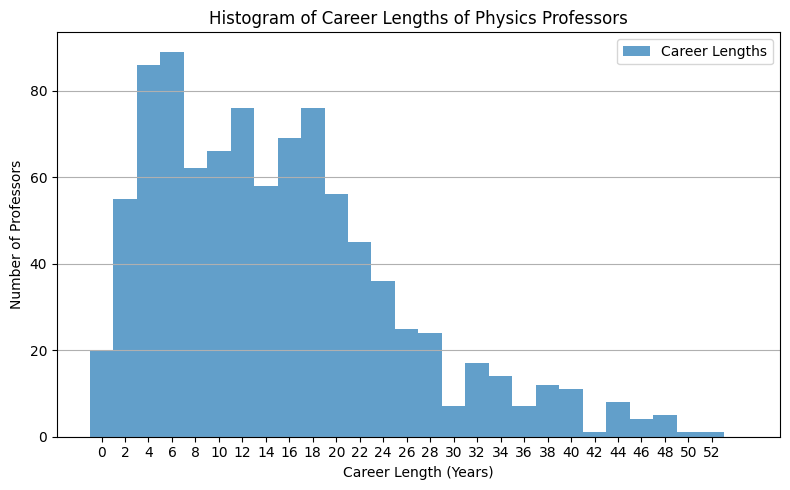

In [119]:
# Calculate career length
df['career_length'] = df['end'] - df['start']

# Create a new column for active researchers
df['is_active'] = df['end'] == 2024

# Prepare data for histogram
career_lengths = df['career_length'].tolist()
active_count = df['is_active'].sum()

# Create a smaller histogram with a taller aspect ratio
plt.figure(figsize=(8, 5))  # Adjusted size for a more balanced plot
plt.hist(career_lengths, bins=range(0, max(career_lengths) + 5, 2), align='left', alpha=0.7, label='Career Lengths')  # Increased bin spacing
# plt.axvline(x=max(career_lengths) + 0.5, color='red', linestyle='dashed', linewidth=1, label='Active Researchers')
# plt.text(max(career_lengths) + 1, active_count, f'Active: {active_count}', color='red')

plt.title('Histogram of Career Lengths of Physics Professors')
plt.xlabel('Career Length (Years)')
plt.ylabel('Number of Professors')

# Set custom x-ticks for better spacing
plt.xticks(range(0, max(career_lengths) + 1, 2))  # Adjust the step for x-ticks
plt.legend()
plt.grid(axis='y')
plt.tight_layout()
plt.show()


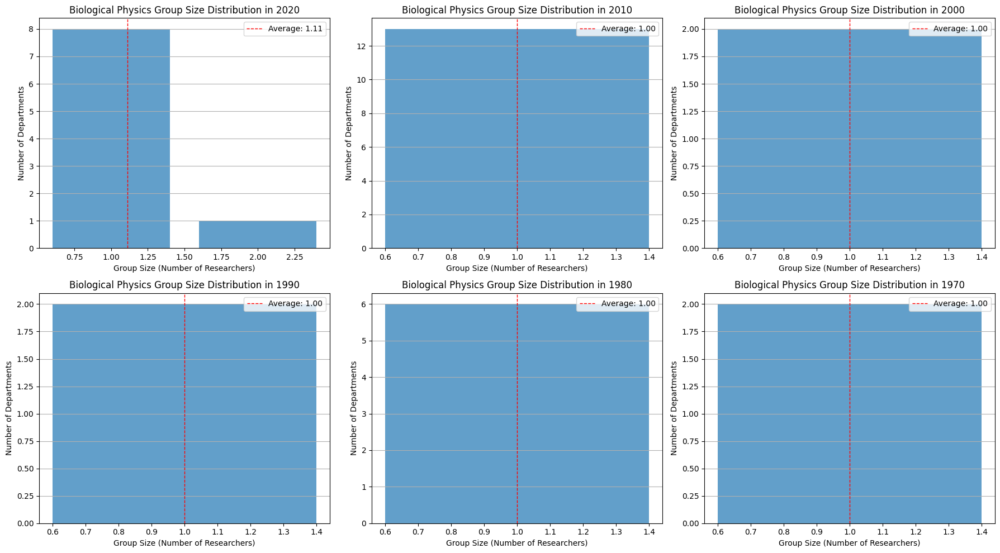

In [120]:
import matplotlib.pyplot as plt
import numpy as np

# Define the years of interest
years_of_interest = [2020, 2010, 2000, 1990, 1980, 1970]

# Create a figure for the histograms
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
axes = axes.flatten()

for i, year in enumerate(years_of_interest):
    # Filter the dataframe for the specific year
    df_year = df[df['end'] == year]  # Assuming 'end' indicates the year of interest
    
    # Count the number of departments with each group size
    group_sizes = df_year['institution'].value_counts()  # Assuming 'institution' represents departments
    group_sizes_count = group_sizes.value_counts().sort_index()  # Count occurrences of each group size
    
    # Calculate the average group size
    average_group_size = group_sizes.mean() if not group_sizes.empty else 0
    
    # Plot the histogram
    axes[i].bar(group_sizes_count.index, group_sizes_count.values, alpha=0.7)
    axes[i].axvline(average_group_size, color='red', linestyle='dashed', linewidth=1, label=f'Average: {average_group_size:.2f}')
    
    # Set titles and labels
    axes[i].set_title(f'Biological Physics Group Size Distribution in {year}')
    axes[i].set_xlabel('Group Size (Number of Researchers)')
    axes[i].set_ylabel('Number of Departments')
    axes[i].legend()
    axes[i].grid(axis='y')

# Adjust layout
plt.tight_layout()
plt.show()

/Users/thegupta/Library/Python/3.9/lib/python/site-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/thegupta/Library/Python/3.9/lib/python/site-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


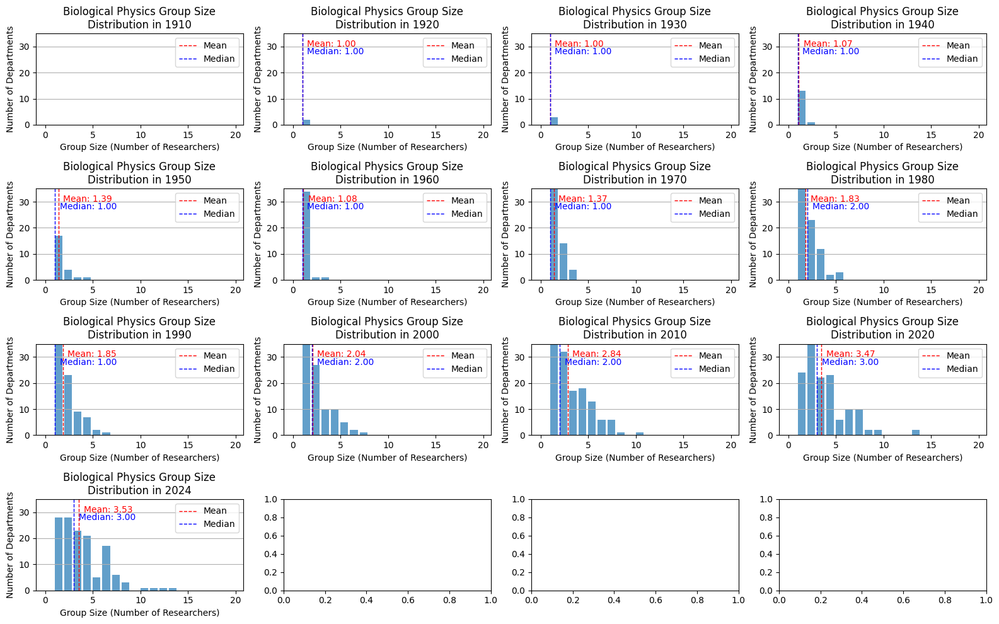

In [121]:
import matplotlib.pyplot as plt
import numpy as np
import textwrap  # Import textwrap for wrapping titles


# Define the range of years
years_of_interest = list(range(1910, 2030, 10))  # From 1910 to 2024 in 10-year increments
years_of_interest.append(2024)

# Create a figure for the histograms
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(16, 10))
axes = axes.flatten()

# Prepare bins for 10-year ranges
bins = np.arange(0, 21)  # Adjust the range based on expected group sizes

for i, year in enumerate(years_of_interest):
    # Filter the dataframe for the specific year
    # starting point before year, end after year; basically, they're active in year
    df_year = df[(df['start'] <= year) & (year <= df['end'])]  # Assuming 'end' indicates the year of interest
    
    # Count the number of departments with each group size
    group_sizes = df_year['institution'].value_counts()  # Assuming 'institution' represents departments
    group_sizes_count = group_sizes.value_counts().sort_index()  # Count occurrences of each group size
    
    # Create a histogram for the 10-year range
    counts, _ = np.histogram(group_sizes, bins=bins)
    
    # Plot the histogram
    axes[i].bar(bins[:-1], counts, width=0.8, alpha=0.7, align='edge')
    
    # Calculate mean and median
    # print(counts)
    # print(group_sizes)
    mean_count = np.mean(group_sizes)
    median_count = np.median(group_sizes)
    
    # Add lines for mean and median
    axes[i].axvline(mean_count, color='red', linestyle='dashed', linewidth=1, label='Mean')
    axes[i].axvline(median_count, color='blue', linestyle='dashed', linewidth=1, label='Median')
    # Annotate mean and median values on the plot
    axes[i].text(mean_count + 0.5, 30, f'Mean: {mean_count:.2f}', color='red', fontsize=10)
    axes[i].text(median_count + 0.5, 27, f'Median: {median_count:.2f}', color='blue', fontsize=10)
    
    # Set titles and labels
    title_text = f'Biological Physics Group Size Distribution in {year}'  # Title text
    wrapped_title = "\n".join(textwrap.wrap(title_text, width=30))  # Wrap the title
    axes[i].set_title(wrapped_title)  # Set the wrapped title

    axes[i].set_xlabel('Group Size (Number of Researchers)')
    axes[i].set_ylabel('Number of Departments')
    
    # Set y-axis limits from 0 to max + 1
    # axes[i].set_ylim(0, max(counts) + 1)
    axes[i].set_ylim(0, 35)
    
    # Add grid
    axes[i].grid(axis='y')
    
    # Add legend
    axes[i].legend()

plt.subplots_adjust(wspace=1, hspace=1.5)  # Increase horizontal and vertical spacing

# Adjust layout
plt.tight_layout()
plt.show()